# Load data

In [ ]:
# prompt: mount a drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
train_df = pd.read_csv('/train.csv')
test_df = pd.read_csv('/test.csv')
store_df = pd.read_csv('/store.csv')
sample_df = pd.read_csv('/sample_submission.csv')
train_df.head(5)

<ipython-input-9-34bd92a929e5>:1: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  train_df = pd.read_csv('/train.csv')


,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


# Data preprocessiong and visualization

In [ ]:
merge_df = train_df.merge(store_df,how='left',on='Store')
merge_test_df = train_df.merge(store_df,how='left',on='Store')

<Axes: xlabel='Sales', ylabel='Customers'>

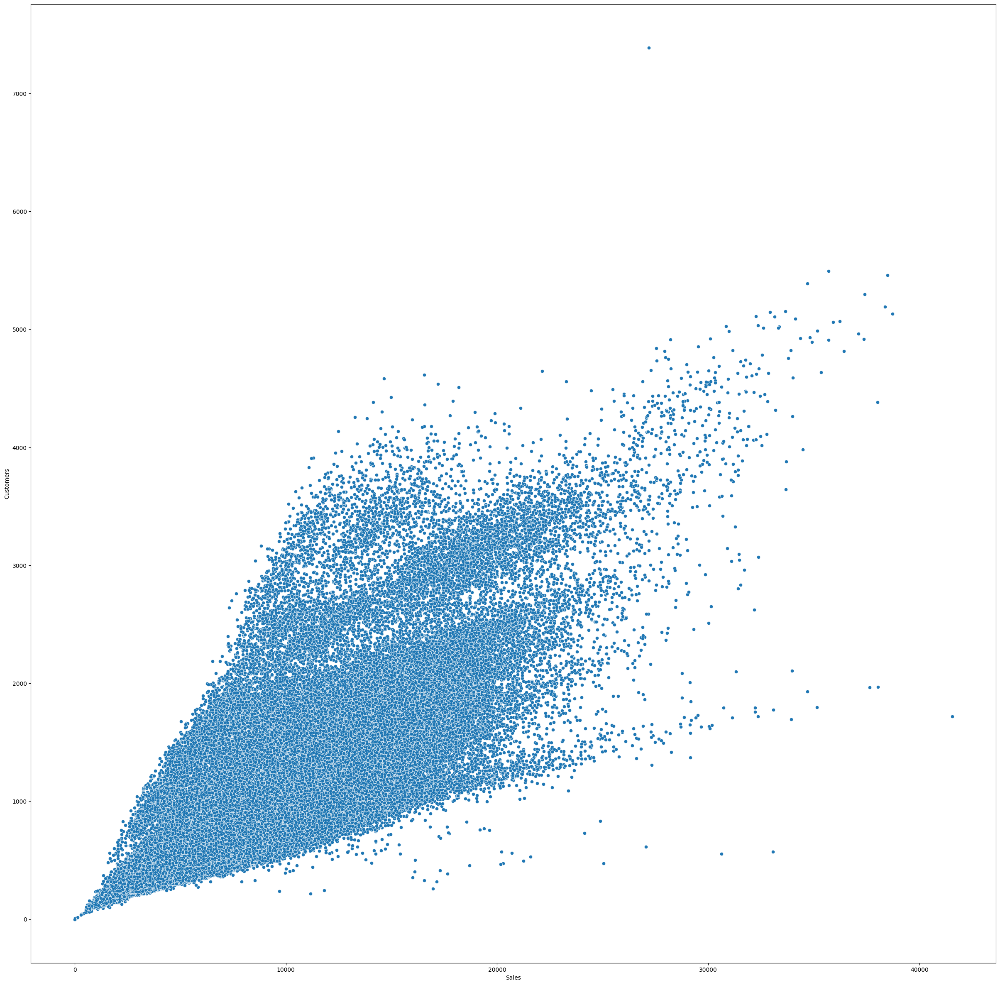

In [ ]:
sns.scatterplot(merge_df,x='Sales',y='Customers')

<Axes: xlabel='year', ylabel='Sales'>

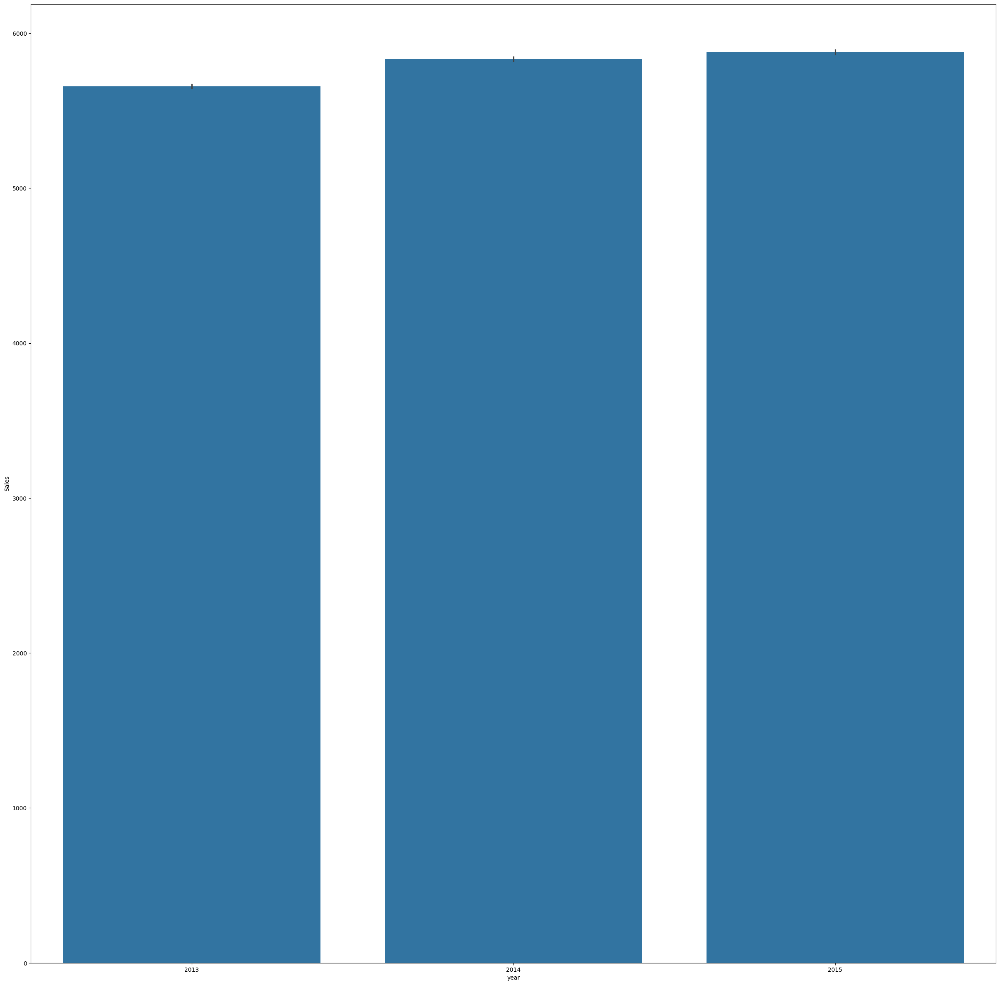

In [ ]:
train_df['year'] = pd.to_datetime(merge_df['Date']).dt.year
sns.barplot(train_df,x='year',y='Sales')

In [ ]:
test_df['year'] = pd.to_datetime(merge_df['Date']).dt.year

In [ ]:
test_df['year'].value_counts()

,count
year,
2015,41088


In [ ]:
merge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 18 columns):
 #   Column                     Non-Null Count    Dtype  
---  ------                     --------------    -----  
 0   Store                      1017209 non-null  int64  
 1   DayOfWeek                  1017209 non-null  int64  
 2   Date                       1017209 non-null  object 
 3   Sales                      1017209 non-null  int64  
 4   Customers                  1017209 non-null  int64  
 5   Open                       1017209 non-null  int64  
 6   Promo                      1017209 non-null  int64  
 7   StateHoliday               1017209 non-null  object 
 8   SchoolHoliday              1017209 non-null  int64  
 9   StoreType                  1017209 non-null  object 
 10  Assortment                 1017209 non-null  object 
 11  CompetitionDistance        1014567 non-null  float64
 12  CompetitionOpenSinceMonth  693861 non-null   float64
 13  CompetitionO

In [ ]:
def split_date(df):
  df['Date'] = pd.to_datetime(df['Date'])
  '''df['Year'] = df.Date.dt.year
  df['Month'] = df.Date.dt.month
  df['Day'] = df.Date.dt.day
  df['Weekofyear'] = df.Date.dt.isocalendar().week'''
  df['Year'] = df.Date.dt.year
  df['Month'] = df.Date.dt.month
  df['Day'] = df.Date.dt.day
  df['Weekofyear'] = df.Date.dt.isocalendar().week

In [ ]:
split_date(merge_df)
split_date(merge_test_df)

In [ ]:
merge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 22 columns):
 #   Column                     Non-Null Count    Dtype         
---  ------                     --------------    -----         
 0   Store                      1017209 non-null  int64         
 1   DayOfWeek                  1017209 non-null  int64         
 2   Date                       1017209 non-null  datetime64[ns]
 3   Sales                      1017209 non-null  int64         
 4   Customers                  1017209 non-null  int64         
 5   Open                       1017209 non-null  int64         
 6   Promo                      1017209 non-null  int64         
 7   StateHoliday               1017209 non-null  object        
 8   SchoolHoliday              1017209 non-null  int64         
 9   StoreType                  1017209 non-null  object        
 10  Assortment                 1017209 non-null  object        
 11  CompetitionDistance        1014567 no

In [ ]:
px.scatter(merge_df,x='Customers',y='Sales',color='StoreType')

In [ ]:
merge_df.StoreType.nunique()

4

In [ ]:
merge_df = merge_df[merge_df.Open == 1].copy()

In [ ]:
def comp_months(df):
    df['CompetitionOpen'] = 12 * (df.Year - df.CompetitionOpenSinceYear) + (df.Month - df.CompetitionOpenSinceMonth)
    df['CompetitionOpen'] = df['CompetitionOpen'].map(lambda x: 0 if x < 0 else x).fillna(0)

In [ ]:
comp_months(merge_df)
comp_months(merge_test_df)

In [ ]:
merge_test_df['CompetitionOpen']

,CompetitionOpen
0,82.0
1,92.0
2,103.0
3,70.0
4,3.0
...,...
1017204,0.0
1017205,81.0
1017206,0.0
1017207,0.0


In [ ]:
def check_promo_month(row):
    month2str = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun',
                 7:'Jul', 8:'Aug', 9:'Sept', 10:'Oct', 11:'Nov', 12:'Dec'}
    try:
        months = (row['PromoInterval'] or '').split(',')
        if row['Promo2Open'] and month2str[row['Month']] in months:
            return 1
        else:
            return 0
    except Exception:
        return 0

def promo_cols(df):
    # Months since Promo2 was open
    df['Promo2Open'] = 12 * (df.Year - df.Promo2SinceYear) +  (df.Weekofyear - df.Promo2SinceWeek)*7/30.5
    df['Promo2Open'] = df['Promo2Open'].map(lambda x: 0 if x < 0 else x).fillna(0) * df['Promo2']
    # Whether a new round of promotions was started in the current month
    df['IsPromo2Month'] = df.apply(check_promo_month, axis=1) * df['Promo2']

In [ ]:
promo_cols(merge_df)
promo_cols(merge_test_df)

In [ ]:
merge_df[['Promo2Open','IsPromo2Month']]

,Promo2Open,IsPromo2Month
0,0.000000,0
1,64.131148,1
2,51.901639,1
3,0.000000,0
4,0.000000,0
...,...,...
1016776,0.000000,0
1016827,0.000000,0
1016863,1.213115,1
1017042,0.000000,0


In [ ]:
merge_df.columns

Index(['Store', 'DayOfWeek', 'Date', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment',
       'CompetitionDistance', 'CompetitionOpenSinceMonth',
       'CompetitionOpenSinceYear', 'Promo2', 'Promo2SinceWeek',
       'Promo2SinceYear', 'PromoInterval', 'Year', 'Month', 'Day',
       'Weekofyear', 'CompetitionOpen', 'Promo2Open', 'IsPromo2Month'],
      dtype='object')

In [ ]:
input_cols =['Store', 'DayOfWeek','Promo',
       'StateHoliday', 'SchoolHoliday', 'StoreType', 'Assortment',
       'CompetitionDistance', 'Promo2',  'Year', 'Month', 'Day',
       'Weekofyear', 'CompetitionOpen', 'Promo2Open', 'IsPromo2Month']
target_col ='Sales'

In [ ]:
inputs = merge_df[input_cols].copy()
target = merge_df[target_col].copy()
test_inputs = merge_test_df[input_cols].copy()
test_target = merge_test_df[target_col].copy()

In [ ]:
inputs.isna().sum()

,0
Store,0
DayOfWeek,0
Promo,0
StateHoliday,0
SchoolHoliday,0
StoreType,0
Assortment,0
CompetitionDistance,2186
Promo2,0
Year,0


In [ ]:
max_distance =inputs.CompetitionDistance.max()
max_distance

75860.0

In [ ]:
inputs['CompetitionDistance'].fillna(max_distance*2,inplace =True)
test_inputs['CompetitionDistance'].fillna(max_distance*2,inplace =True)

<ipython-input-56-325e33219036>:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-56-325e33219036>:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[

In [ ]:
numeric_cols = ['Store', 'Promo', 'SchoolHoliday',
              'CompetitionDistance', 'CompetitionOpen', 'Promo2', 'Promo2Open', 'IsPromo2Month',
              'Day', 'Month', 'Year', 'Weekofyear',  ]
categorical_cols = ['DayOfWeek', 'StateHoliday', 'StoreType', 'Assortment']

In [ ]:
from sklearn.preprocessing  import MinMaxScaler
scaler = MinMaxScaler().fit(inputs[numeric_cols])

In [ ]:
inputs[numeric_cols] = scaler.transform(inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [ ]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(sparse_output=False, handle_unknown='ignore').fit(inputs[categorical_cols].astype(str))
encoded_cols = list(enc.get_feature_names_out(categorical_cols))
encoded_cols

['DayOfWeek_1',
 'DayOfWeek_2',
 'DayOfWeek_3',
 'DayOfWeek_4',
 'DayOfWeek_5',
 'DayOfWeek_6',
 'DayOfWeek_7',
 'StateHoliday_0',
 'StateHoliday_a',
 'StateHoliday_b',
 'StateHoliday_c',
 'StoreType_a',
 'StoreType_b',
 'StoreType_c',
 'StoreType_d',
 'Assortment_a',
 'Assortment_b',
 'Assortment_c']

In [ ]:
inputs[encoded_cols] = enc.transform(inputs[categorical_cols].astype(str))
test_inputs[encoded_cols] = enc.transform(test_inputs[categorical_cols].astype(str))

In [ ]:
X =inputs[numeric_cols+encoded_cols]
X_test =test_inputs[numeric_cols+encoded_cols]

# Model Training

In [ ]:
from xgboost import XGBRegressor
model = XGBRegressor(n_estimators =20,max_depth=4,n_jobs=-1).fit(X,target)
pred = model.predict(X)
pred

array([ 8073.2007,  7278.4395,  8812.854 , ...,  7913.415 ,  7336.718 ,
       10780.133 ], dtype=float32)

In [ ]:
from sklearn.metrics import mean_squared_error

def rmse(a, b):
    return mean_squared_error(a, b)**0.5

In [ ]:
rmse(pred,target)

2357.128019433819

In [ ]:
import matplotlib.pyplot as plt
from xgboost import plot_tree
from matplotlib.pylab import rcParams
%matplotlib inline

rcParams['figure.figsize'] = 30,30

<Axes: >

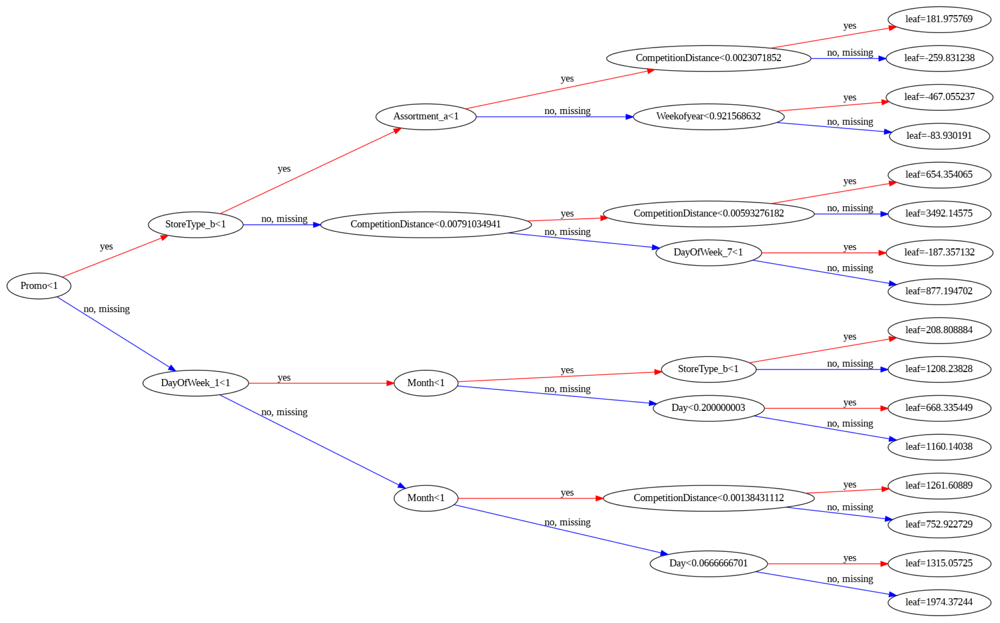

In [ ]:
plot_tree(model,rankdir='LR')

In [ ]:
importance_df = pd.DataFrame({
    'feature':X.columns,
    'weight': model.feature_importances_
}).sort_values('weight',ascending=False)

<Axes: title={'center': 'Feature Importance'}, xlabel='weight', ylabel='feature'>

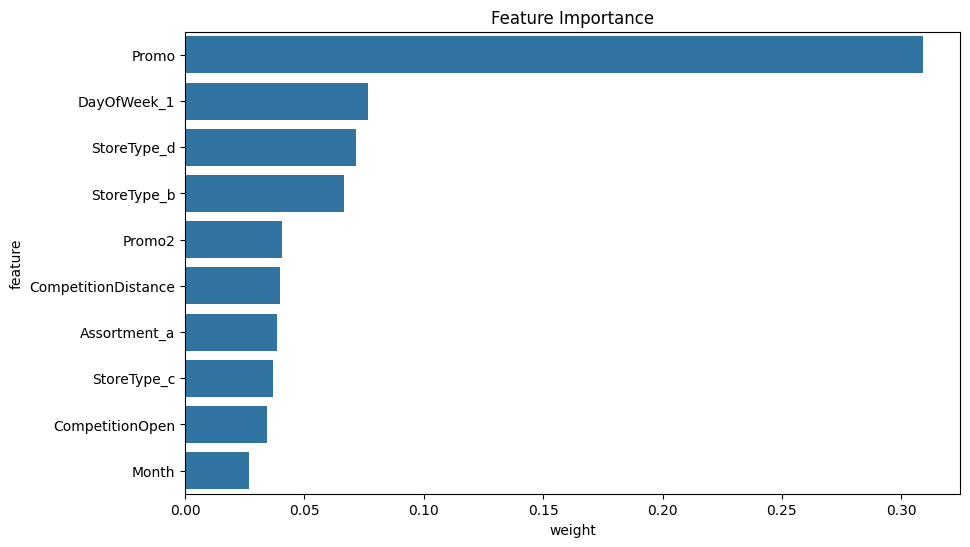

In [ ]:
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(importance_df.head(10),x='weight',y='feature')

In [ ]:
from sklearn.model_selection import KFold

In [ ]:
def test_and_evaluate(X_train,train_targets,X_val,val_targets,**params):
  model = XGBRegressor(random_state=42,n_jobs=-1,**params)
  model.fit(X_train,train_targets)
  train_rmse = rmse(model.predict(X_train),train_targets)
  val_rmse = rmse(model.predict(X_val),val_targets)
  return model,train_rmse,val_rmse

In [ ]:
kfold = KFold(n_splits=5)

In [ ]:
models =[]
for train_idxs,val_idxs in kfold.split(X):
  X_train,train_targets=X.iloc[train_idxs],target.iloc[train_idxs]
  X_val,val_targets=X.iloc[val_idxs],target.iloc[val_idxs]
  model,train_rmse,val_rmse=test_and_evaluate(X_train,train_targets,X_val,val_targets,n_estimators=20,max_depth=4)
  models.append(model)
  train_rmse,val_rmse

In [ ]:
import numpy as np
def predict_avg(models,inputs):
  return np.mean([model.predict(inputs) for model in models],axis=0)
predict_avg(models,X)

array([8013.9463, 7508.8916, 8623.156 , ..., 7844.056 , 7589.815 ,
       9704.449 ], dtype=float32)

In [ ]:
(models[0].predict(X)+models[1].predict(X))/2

array([8358.682 , 7635.2812, 9072.122 , ..., 7889.0566, 6777.722 ,
       9651.761 ], dtype=float32)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, train_targets, val_targets = train_test_split(X, target, test_size=0.1)

In [ ]:
def test_params(**params):
    model = XGBRegressor(n_jobs=-1, random_state=42, **params)
    model.fit(X_train, train_targets)
    train_rmse = rmse(model.predict(X_train), train_targets)
    val_rmse = rmse(model.predict(X_val), val_targets)
    print('Train RMSE: {}, Validation RMSE: {}'.format(train_rmse, val_rmse))

In [ ]:
test_params(n_estimators=200,max_depth=10)

Train RMSE: 551.4271824094275, Validation RMSE: 706.4219038577442
